# View  Spectraction Results in OGA

 work with Weakly_2023_11
- use jupyter kernel LSST
- author : Sylvie Dagoret-Campagne
- affiliation : IJCLab
- creation date : 2023/04/05
- last update : 2023/04/07

- Spectractor https://github.com/lsst/Spectractor/
- Spectractor Version 2.4
- branch lsst-dev
- available in version w_2023_11 by default


In [1]:
! eups list -s | grep LOCAL

atmospec              LOCAL:/home/d/dagoret/repos/repos_w_2023_11/atmospec 	setup
eups                  LOCAL:/opt/lsst/software/stack/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-5.1.0/eups 	setup


In [2]:
! eups list -s lsst_distrib

   gdf42428520+c82c1836b5 	current w_2023_11 setup


In [3]:
import h5py

In [4]:
import lsst.daf.butler as dafButler
#import lsst.summit.utils.butlerUtils as butlerUtils

In [5]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
import pandas as pd

import matplotlib.ticker                         # here's where the formatter is
import os
import re
import pandas as pd

plt.rcParams["figure.figsize"] = (4,3)
plt.rcParams["axes.labelsize"] = 'xx-large'
plt.rcParams['axes.titlesize'] = 'xx-large'
plt.rcParams['xtick.labelsize']= 'xx-large'
plt.rcParams['ytick.labelsize']= 'xx-large'
plt.rcParams.update({'figure.max_open_warning': 0})

In [6]:
import pickle

In [7]:
from astropy.time import Time
import astropy.units as u

## Config

In [8]:
FLAG_MOUNT_ERRORS= True
FLAG_SHOW_ORDER1ORDER2 = True # if want to study both orders

### Butler

In [9]:
#repo =  "/sdf/group/rubin/repo/main"
#repo = "/sdf/group/rubin/repo/oga/"
repo = "/repo/embargo/"
butler = dafButler.Butler(repo)
registry = butler.registry

### Date & Filter & Disperser & collection

- make your choice

In [10]:
DateToRuncollection = {
    
    
 # september 2022
 20220912 :  "u/dagoret/BPS_manyspectro_v60", # Missing collection
 20220913 :  "u/dagoret/BPS_manyspectro_v61", # Missing collection
 20220914 :  "u/dagoret/BPS_manyspectro_v62", # Missing collection  
    
 20220927 :  "u/dagoret/BPS_manyspectro_v63", # Mount errors available, mitigé
 20220928 :  "u/dagoret/BPS_manyspectro_v64", # Mount errors available, very nice spectra
 20220929 :  "u/dagoret/BPS_manyspectro_v65", # Mount errors available, very nice spectra
    
    
 # october 2022
 20221012 :  "u/dagoret/BPS_manyspectro_v56", # mount errors , nice, all good
 20221025 :  "u/dagoret/BPS_manyspectro_v57", # mount errors, very very bad spectra, run not selected
 20221026 :  "u/dagoret/BPS_manyspectro_v58", # mount errors,  very nice spectra, all good
 20221027 :  "u/dagoret/BPS_manyspectro_v59", # mount errors,  nice spectra, all good
    
 # november 2022
 20221109 :  "u/dagoret/BPS_manyspectro_v53", # mount errors, nice spectra, few bad labelled as good 
 20221110 :  "u/dagoret/BPS_manyspectro_v54", # mount errors available, many bad rec spectra, few bad labelled as good, versy strange
 20221123 :  "u/dagoret/BPS_manyspectro_v55", # mount errors , nice   
    
 # december 2022   
 20221207 :  "u/dagoret/BPS_manyspectro_v48", # No mount error, nice spectra
 20221208 :  "u/dagoret/BPS_manyspectro_v49", # No mount error, nice spectra, one bad labelled as good
 20221209 :  "u/dagoret/BPS_manyspectro_v50", # No mount error, spectra at distance from optical center, very interesting
 20221210 :  "u/dagoret/BPS_manyspectro_v51", # No mount error, bof
 20221212 :  "u/dagoret/BPS_manyspectro_v52", # No mount error, very bad gains and instability 
    
 #January 2023 
 20230117 :  "u/dagoret/BPS_manyspectro_v79", # no mount errors, some mucol spectra that looks good are rejected on DCCD
 20230118 :  "u/dagoret/BPS_manyspectro_v80", # no mount error, some mucol looking good are rejected, many bad centroid calculation
 20230119 :  "u/dagoret/BPS_manyspectro_v77", # no mount errors, many blurred spectra probably due to strong tracking error
 20230131 :  "u/dagoret/BPS_manyspectro_v78", # missing for moment

 #february 2023
 20230214 :  "u/dagoret/BPS_manyspectro_v42", # no mount errors, nothing special
 20230215 :  "u/dagoret/BPS_manyspectro_v43", # mount errors, OK
 20230216 :  "u/dagoret/BPS_manyspectro_v44", # mount errors, OK, nice spectra 
 20230228 :  "u/dagoret/BPS_manyspectro_v70", # No mount error,OK nice spectra
    
 #march 2023  
 20230301 :  "u/dagoret/BPS_manyspectro_v71", # no mount errors, OK many spectra
 20230302 :  "u/dagoret/BPS_manyspectro_v72", # no mount error, sometime bad subtraction of order2 on HD38666 (mucol) 
 20230315 :  "u/dagoret/BPS_manyspectro_v73", # mount errors
 20230316 :  "u/dagoret/BPS_manyspectro_v74", # mount errors 
    
}

In [11]:
DATE = 20230316
my_collection = DateToRuncollection[DATE]

filterdispersername = "empty~holo4_003"

RUNSELECTION = 20230330
#RUNSELECTION = 20230403

# List of Dataset types avalaible in my collection

## List of dataset types

In [12]:
list(registry.queryDatasetTypes("*spec*"))

[DatasetType('atmospecCentroid', {band, instrument, detector, physical_filter, visit}, StructuredDataDict),
 DatasetType('spectraction', {band, instrument, detector, physical_filter, visit}, Spectraction),
 DatasetType('spectractorImage', {band, instrument, detector, physical_filter, visit}, SpectractorImage),
 DatasetType('spectractorSpectrum', {band, instrument, detector, physical_filter, visit}, SpectractorSpectrum)]

## list of datasets

In [13]:
list(registry.queryDatasets("*spec*", collections=[my_collection]))[:10]

[DatasetRef(DatasetType('atmospecCentroid', {band, instrument, detector, physical_filter, visit}, StructuredDataDict), {instrument: 'LATISS', detector: 0, visit: 2023031600465, ...}, id=0ab0db43-2a44-41d3-b1a4-25973c1b4fdc, run='u/dagoret/BPS_manyspectro_v74/20230331T142319Z'),
 DatasetRef(DatasetType('atmospecCentroid', {band, instrument, detector, physical_filter, visit}, StructuredDataDict), {instrument: 'LATISS', detector: 0, visit: 2023031600466, ...}, id=566ee751-b1e2-4b45-9027-57bc2b432471, run='u/dagoret/BPS_manyspectro_v74/20230331T142319Z'),
 DatasetRef(DatasetType('atmospecCentroid', {band, instrument, detector, physical_filter, visit}, StructuredDataDict), {instrument: 'LATISS', detector: 0, visit: 2023031600473, ...}, id=7b7bb7e8-eabe-4caa-884e-62a78da97ac8, run='u/dagoret/BPS_manyspectro_v74/20230331T142319Z'),
 DatasetRef(DatasetType('atmospecCentroid', {band, instrument, detector, physical_filter, visit}, StructuredDataDict), {instrument: 'LATISS', detector: 0, visit: 2

### Spectractor

In [14]:
configmode = "PSF2DFFM_REBIN2"
#configmode = "PSF2DFFM_REBIN1"
#ext="_b"
specver="specV2.4"

https://www.pythonforthelab.com/blog/how-to-use-hdf5-files-in-python/

In [15]:
#summary_file = f"summaryspectra_{DATE}-{filterdispersername}-{configmode}-oga.csv"
output_file_h5 = f"allspectra_{DATE}-{filterdispersername}-{configmode}-{specver}-oga-b.hdf5"

### The collection

In [16]:
datasetRefs = registry.queryDatasets(datasetType='spectractorSpectrum', collections=my_collection, where= "instrument='LATISS'")

In [17]:
# following line not possible in OGA
#butler = butlerUtils.makeDefaultLatissButler(extraCollections=[my_collection])

In [18]:
if FLAG_MOUNT_ERRORS:
    df_mounterrors = pd.read_csv("mountErrors.csv")
    df=df_mounterrors[df_mounterrors["date_obs"] == DATE ]
    if len(df) == 0:
        FLAG_MOUNT_ERRORS = False
        

In [19]:
df_mounterrors

,Unnamed: 0,idx,date_obs,seq,exposure,status,az_rms,el_rms,rot_rms,image_az_rms,image_el_rms,image_rot_rms
0,437,437,20220908,66,2022090800066,True,0.040777,0.026023,0.291703,0.020020,0.026023,0.000396
1,444,444,20220908,73,2022090800073,True,0.011192,0.007489,0.614963,0.005322,0.007489,0.000835
2,447,447,20220912,3,2022091200003,True,0.006601,0.005453,0.706174,0.005130,0.005453,0.000959
3,516,516,20220912,72,2022091200072,True,0.004987,0.004895,0.159655,0.003876,0.004895,0.000217
4,522,522,20220912,78,2022091200078,True,0.098272,0.052172,0.148901,0.048586,0.052172,0.000202
...,...,...,...,...,...,...,...,...,...,...,...,...
16645,43253,43253,20230321,43,2023032100043,True,0.010867,0.011750,0.004012,0.009384,0.011750,0.000005
16646,43254,43254,20230321,44,2023032100044,True,0.010794,0.007538,0.007706,0.009318,0.007538,0.000010
16647,43255,43255,20230321,45,2023032100045,True,0.023044,0.014788,0.300176,0.019884,0.014788,0.000407
16648,43256,43256,20230321,46,2023032100046,True,0.265174,0.060447,0.004043,0.246965,0.060447,0.000005


In [20]:
df

,Unnamed: 0,idx,date_obs,seq,exposure,status,az_rms,el_rms,rot_rms,image_az_rms,image_el_rms,image_rot_rms
15884,42397,42397,20230316,4,2023031600004,True,0.023846,0.019690,0.110792,0.016811,0.019690,0.000150
15885,42398,42398,20230316,5,2023031600005,True,0.071928,0.005633,1.344598,0.012404,0.005633,0.001825
15886,42408,42408,20230316,15,2023031600015,True,0.096322,0.020852,0.184972,0.047582,0.020852,0.000251
15887,42409,42409,20230316,16,2023031600016,True,0.132812,0.015379,0.149260,0.065563,0.015379,0.000203
15888,42410,42410,20230316,17,2023031600017,True,0.059687,0.019009,0.122901,0.029433,0.019009,0.000167
...,...,...,...,...,...,...,...,...,...,...,...,...
16604,43132,43132,20230316,739,2023031600739,True,0.290712,0.028284,0.233921,0.114130,0.028284,0.000318
16605,43133,43133,20230316,740,2023031600740,True,0.210542,0.031858,0.328596,0.082851,0.031858,0.000446
16606,43134,43134,20230316,741,2023031600741,True,0.158880,0.023279,0.212101,0.062699,0.023279,0.000288
16607,43135,43135,20230316,742,2023031600742,True,0.195244,0.017917,0.184580,0.077193,0.017917,0.000251


In [21]:
FLAG_MOUNT_ERRORS 

True

## Loop on exposures

In [22]:
#outfile.close()

In [23]:
all_dataId = []     # full data id
all_spec = []       # spectra
all_exposures = []  # exposure number
all_num = []        # sequence numbers
all_h5group = []

hf_outfile =  h5py.File(output_file_h5, 'w') 
  

for i, ref in enumerate(datasetRefs):

    print(f"============= ({i}) ============datasetType = spectraction ============================================")
    print("fullId..................:",ref.dataId.full)
    print("visit...................:",ref.dataId["visit"])
    print("band....................:",ref.dataId["band"])
    print("physical filter.........:",ref.dataId["physical_filter"])
    print("run.....................:",ref.run)
    
    #through old runs
    date_of_run = int(ref.run.split("/")[-1].split("T")[0])
    if date_of_run< RUNSELECTION :
        continue
 
    
    
    the_exposure = ref.dataId["visit"]
    the_day_obs = ref.dataId["visit"]//100_000
    the_seq_num = ref.dataId["visit"]- the_day_obs*100_000    
    the_dataId = {'day_obs': the_day_obs,'seq_num':the_seq_num,'detector':0}
    print(the_dataId)
    
    the_exposure_key = str(the_exposure)
    
    if the_exposure not in all_exposures:
        g = hf_outfile.create_group(the_exposure_key)
        all_h5group.append(g) 
    else:
        print(f">>>>>>  already existing key {the_exposure_key} Skip it !!! ")
        the_exposure_key = the_exposure_key + "_b"
        continue
   
    
    # retrieve the spectrum from Butler
    #spec       = butler.get('spectraction',the_dataId)
    spec = butler.get('spectractorSpectrum', visit=the_exposure, detector=0, collections=my_collection, instrument='LATISS')
    
    # save in collection lists
    all_dataId.append(the_dataId) 
    all_exposures.append(the_exposure)
    all_spec.append(spec)
    all_num.append(the_seq_num)
    

============= (0) ============datasetType = spectraction ============================================
fullId..................: {band: 'white', instrument: 'LATISS', detector: 0, physical_filter: 'empty~holo4_003', visit: 2023031600654}
visit...................: 2023031600654
band....................: white
physical filter.........: empty~holo4_003
run.....................: u/dagoret/BPS_manyspectro_v74/20230331T142319Z
{'day_obs': 20230316, 'seq_num': 654, 'detector': 0}
============= (1) ============datasetType = spectraction ============================================
fullId..................: {band: 'white', instrument: 'LATISS', detector: 0, physical_filter: 'empty~holo4_003', visit: 2023031600537}
visit...................: 2023031600537
band....................: white
physical filter.........: empty~holo4_003
run.....................: u/dagoret/BPS_manyspectro_v74/20230331T142319Z
{'day_obs': 20230316, 'seq_num': 537, 'detector': 0}
============= (2) ============datasetType = sp

In [24]:
hf_outfile.keys()

<KeysViewHDF5 ['2023031600465', '2023031600466', '2023031600473', '2023031600474', '2023031600488', '2023031600489', '2023031600497', '2023031600498', '2023031600505', '2023031600506', '2023031600520', '2023031600521', '2023031600528', '2023031600529', '2023031600536', '2023031600537', '2023031600544', '2023031600545', '2023031600553', '2023031600554', '2023031600561', '2023031600562', '2023031600569', '2023031600570', '2023031600577', '2023031600578', '2023031600589', '2023031600590', '2023031600597', '2023031600598', '2023031600608', '2023031600609', '2023031600616', '2023031600617', '2023031600624', '2023031600625', '2023031600631', '2023031600645', '2023031600646', '2023031600653', '2023031600654', '2023031600662', '2023031600663', '2023031600670', '2023031600671', '2023031600681', '2023031600682', '2023031600689', '2023031600690', '2023031600697', '2023031600698', '2023031600705', '2023031600706', '2023031600713', '2023031600714', '2023031600722', '2023031600723', '2023031600730',

In [25]:
index = 0
spec = all_spec[index]

In [26]:
the_h5group = all_h5group[index] 

In [27]:
spec.chromatic_psf.plot_summary()

In [28]:
def DumpSpectrum(spec):
    print("--------------------------------------------")
    print("spec.target.label\t",spec.target.label)
    print("spec.filter_label\t",spec.filter_label)
    print("spec.airmass\t",spec.airmass)
    print("spec.date_obs\t",spec.date_obs)
    print("spec.temperature\t",spec.temperature)
    print("spec.pressure\t",spec.pressure)
    print("spec.humidity\t",spec.humidity)    
    #print("spec.ra\t",spec.ra)
    print("spec.dec\t",spec.dec)
    print("spec.hour_angle\t",spec.hour_angle)
    print("spec.parallactic_angle\t",spec.parallactic_angle)
    print("spec.camera_angle\t", spec.camera_angle)
    print("--------------------------------------------")
    print("spec.order\t",spec.order)
    print("spec.lambdas\t",spec.lambdas)
    print("spec.data\t",spec.data)
    print("spec.err\t",spec.err)
    print("spec.covmatrix\t",spec.cov_matrix)
    print("--------------------------------------------")
    print("spec.data_next_order\t",spec.data_next_order)
    print("spec.err_next_order\t",spec.err_next_order)

In [29]:
def AddDataSetsInGroup(spec,h5group):
   
    #spectrum

    h5group.attrs['spec_target_label'] = spec.target.label
    h5group.attrs['spec_filter_label'] = spec.filter_label
    h5group.attrs["spec_date_obs"] = spec.date_obs
    h5group.attrs["spec_airmass"] = spec.airmass 
    h5group.attrs["spec_temperature"] = spec.temperature
    h5group.attrs["spec_pressure"] = spec.pressure
    h5group.attrs["spec_humidity"] = spec.humidity
    h5group.attrs["spec_dec"] = spec.dec
    h5group.attrs["spec_hour_angle"] = spec.hour_angle
    h5group.attrs["spec_parallactic_angle"] = spec.parallactic_angle
    h5group.attrs["spec_camera_angle"] = spec.camera_angle
    h5group.attrs["spec_order"] = spec.order
    
    
    d = h5group.create_dataset("spec_lambdas",data=spec.lambdas,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_data",data=spec.data,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_err",data=spec.err,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_covmatrix",data=spec.cov_matrix,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_data_next_order",data=spec.data_next_order,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_err_next_order",data=spec.err_next_order,compression="gzip", compression_opts=9)
    
    # spectrogram
    
    d = h5group.create_dataset("spec_spectrogram",data=spec.spectrogram,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_spectrogram_bgd",data=spec.spectrogram_bgd,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_spectrogram_bgd_rms",data=spec.spectrogram_bgd_rms,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_spectrogram_err",data=spec.spectrogram_err,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_spectrogram_residuals",data=spec.spectrogram_residuals,compression="gzip", compression_opts=9)
    d = h5group.create_dataset("spec_spectrogram_fit",data=spec.spectrogram_fit,compression="gzip", compression_opts=9)
    
    
    h5group.attrs["spec_spectrogram_x0"]=spec.spectrogram_x0
    h5group.attrs["spec_spectrogram_y0"]=spec.spectrogram_y0
    h5group.attrs["spec_spectrogram_xmin"]=spec.spectrogram_xmin
    h5group.attrs["spec_spectrogram_xmax"]=spec.spectrogram_xmax
    h5group.attrs["spec_spectrogram_ymin"]=spec.spectrogram_ymin
    h5group.attrs["spec_spectrogram_ymax"]=spec.spectrogram_ymax
    h5group.attrs["spec_spectrogram_deg"]=spec.spectrogram_deg
    h5group.attrs["spec_spectrogram_saturation"]=spec.spectrogram_saturation      
    h5group.attrs["spec_spectrogram_Nx"]=spec.spectrogram_Nx
    h5group.attrs["spec_spectrogram_Ny"]=spec.spectrogram_Ny
    
    
    # header
    
    h5group.attrs["spec_header_target"]=spec.header["TARGET"]
    h5group.attrs["spec_header_redshift"]=spec.header["REDSHIFT"]
    h5group.attrs['spec_header_grating']=spec.header["GRATING"]
    h5group.attrs["spec_header_rotangle"]=spec.header["ROTANGLE"]
    h5group.attrs["spec_header_d2ccd"]=spec.header["D2CCD"]
    h5group.attrs["spec_header_lshift"]=spec.header["LSHIFT"]
    h5group.attrs["spec_header_parangle"]=spec.header["PARANGLE"]
    h5group.attrs["spec_header_targetx"]=spec.header["TARGETX"]
    h5group.attrs["spec_header_targety"]=spec.header["TARGETY"]
    h5group.attrs["spec_header_lbda_ref"]=spec.header["LBDA_REF"]
    h5group.attrs["spec_header_pixshift"]=spec.header["PIXSHIFT"]
    h5group.attrs["spec_header_psf_reg"]=spec.header["PSF_REG"]
    h5group.attrs["spec_header_trace_r"]=spec.header["TRACE_R"]   
    h5group.attrs["spec_header_chi2_fit"]=spec.header["CHI2_FIT"]   
    h5group.attrs["spec_header_a2_fit"]=spec.header["A2_FIT"]
    h5group.attrs["spec_header_am_fit"]=spec.header["AM_FIT"]
    h5group.attrs["spec_header_meanfwhm"]=spec.header["MEANFWHM"]
    h5group.attrs["spec_header_version"]=spec.header["VERSION"]
    h5group.attrs["spec_header_rebin"]=spec.header["REBIN"]
    h5group.attrs['spec_header_date-obs']=spec.header["DATE-OBS"]
    h5group.attrs["spec_header_exptime"]=spec.header["EXPTIME"]
    h5group.attrs["spec_header_airmass"]=spec.header["AIRMASS"] 
    h5group.attrs["spec_header_dec"]=spec.header["DEC"]
    h5group.attrs["spec_header_ha"]=spec.header["HA"]
    h5group.attrs["spec_header_outtemp"]=spec.header["OUTTEMP"] 
    h5group.attrs["spec_header_outpress"]=spec.header["OUTPRESS"] 
    h5group.attrs["spec_header_outhum"]=spec.header["OUTHUM"]
    h5group.attrs["spec_header_filter"]=spec.header["FILTER"]
    h5group.attrs["spec_header_cam_rot"]=spec.header["CAM_ROT"] 
    h5group.attrs["spec_header_s_x0"]=spec.header["S_X0"]
    h5group.attrs["spec_header_s_y0"]=spec.header["S_Y0"]
    h5group.attrs["spec_header_s_xmin"]=spec.header["S_XMIN"]      
    h5group.attrs["spec_header_s_xmax"]=spec.header["S_XMAX"]                                               
    h5group.attrs["spec_header_s_ymin"]=spec.header["S_YMIN"]      
    h5group.attrs["spec_header_s_ymax"]=spec.header["S_YMAX"]                                                                                                                  
    h5group.attrs["spec_header_s_nx"]=spec.header["S_NX"]
    h5group.attrs["spec_header_s_ny"]=spec.header["S_NY"]   
    h5group.attrs["spec_header_s_dec"]=spec.header["S_DEG"]  
    h5group.attrs["spec_header_s_sat"]=spec.header["S_SAT"]      
                                               
    

In [30]:
def AddMountErrorsInGroup(h5group,az_rms,el_rms,rot_rms,image_az_rms,image_el_rms,image_rot_rms):
    h5group.attrs["me_az_rms"]=az_rms
    h5group.attrs["me_el_rms"]=el_rms
    h5group.attrs["me_rot_rms"]=rot_rms
    h5group.attrs["me_image_az_rms"]=image_az_rms
    h5group.attrs["me_image_el_rms"]=image_el_rms
    h5group.attrs["me_image_rot_rms"]=image_rot_rms
        

In [31]:
def AddDataSetsInGroupAndIndexExposure(spec,h5group,index,exposure):

    h5group.attrs["index"]=index
    h5group.attrs["exposure"]=exposure
    
    AddDataSetsInGroup(spec,h5group)

In [32]:
DumpSpectrum(spec)

--------------------------------------------
spec.target.label	 HD167060
spec.filter_label	 empty
spec.airmass	 1.30749286208415
spec.date_obs	 2023-03-17T08:50:17.178498038Z
spec.temperature	 0
spec.pressure	 0
spec.humidity	 0
spec.dec	 -61.6647520851273
spec.hour_angle	 -38.30336013141046
spec.parallactic_angle	 -56.26108568609804
spec.camera_angle	 236.5568215536198
--------------------------------------------
spec.order	 1
spec.lambdas	 [ 296.64810783  297.35766761  298.06721592 ... 1089.09483594 1089.77822196
 1090.46157286]
spec.data	 [-4.99475868e-15 -3.21563906e-15  5.09869573e-16 ...  4.40590779e-15
  7.53302554e-15  8.20618605e-15]
spec.err	 [4.52372171e-15 2.63302738e-15 2.71823020e-15 ... 1.58858929e-15
 1.43050841e-15 2.26042907e-15]
spec.covmatrix	 [[ 2.04640581e-29  5.08188309e-30 -5.76155947e-30 ... -3.37699489e-47
  -4.71385340e-47 -6.16213876e-47]
 [ 5.08188309e-30  6.93283316e-30  2.99027455e-31 ...  7.01170894e-47
   9.40856488e-47  1.21858147e-46]
 [-5.76155947e-3

# Save all spectra in a single file

In [33]:
exposures_sorted = np.sort(all_exposures)

In [34]:
for idx,spec in enumerate(all_spec):   
    the_exposure = all_exposures[idx]
    the_sorted_index = np.where(exposures_sorted == the_exposure)[0][0]
    AddDataSetsInGroupAndIndexExposure(spec,all_h5group[idx],the_sorted_index,the_exposure)
    if FLAG_MOUNT_ERRORS:
        df_exp_selected = df[df["exposure"] == the_exposure]
        N = len(df_exp_selected)
        if (N)>0:
            az_rms = df_exp_selected["az_rms"].values[0]
            el_rms = df_exp_selected["el_rms"].values[0]
            rot_rms = df_exp_selected["rot_rms"].values[0]
            image_az_rms = df_exp_selected["image_az_rms"].values[0]
            image_el_rms = df_exp_selected["image_el_rms"].values[0]
            image_rot_rms = df_exp_selected["image_rot_rms"].values[0]
            AddMountErrorsInGroup(all_h5group[idx],az_rms,el_rms,rot_rms,image_az_rms,image_el_rms,image_rot_rms)
        else:
            print(f"No error mount for exposure {the_exposure}")
            

In [35]:
hf_outfile.keys()

<KeysViewHDF5 ['2023031600465', '2023031600466', '2023031600473', '2023031600474', '2023031600488', '2023031600489', '2023031600497', '2023031600498', '2023031600505', '2023031600506', '2023031600520', '2023031600521', '2023031600528', '2023031600529', '2023031600536', '2023031600537', '2023031600544', '2023031600545', '2023031600553', '2023031600554', '2023031600561', '2023031600562', '2023031600569', '2023031600570', '2023031600577', '2023031600578', '2023031600589', '2023031600590', '2023031600597', '2023031600598', '2023031600608', '2023031600609', '2023031600616', '2023031600617', '2023031600624', '2023031600625', '2023031600631', '2023031600645', '2023031600646', '2023031600653', '2023031600654', '2023031600662', '2023031600663', '2023031600670', '2023031600671', '2023031600681', '2023031600682', '2023031600689', '2023031600690', '2023031600697', '2023031600698', '2023031600705', '2023031600706', '2023031600713', '2023031600714', '2023031600722', '2023031600723', '2023031600730',

In [36]:
#AddDataSetsInGroup(spec,the_h5group) # done previously
#hf_outfile.close() 

## Plot

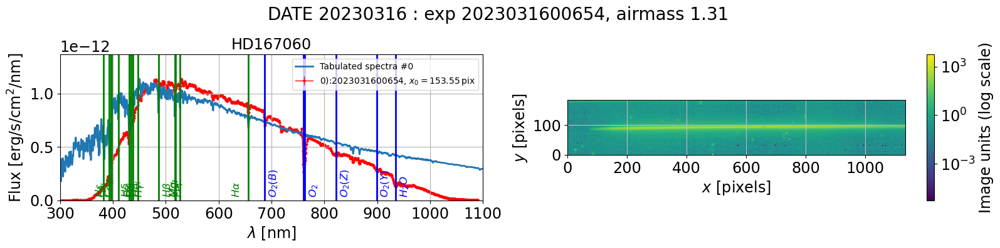

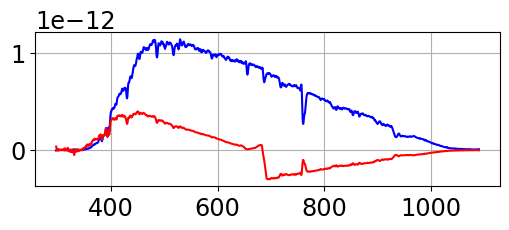

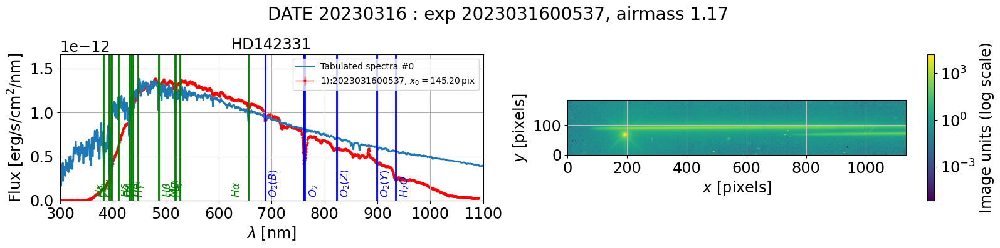

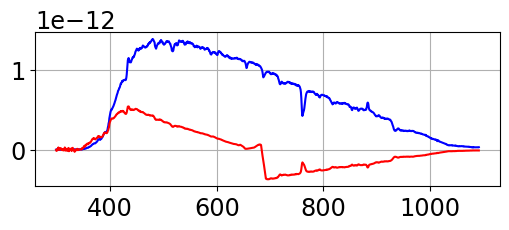

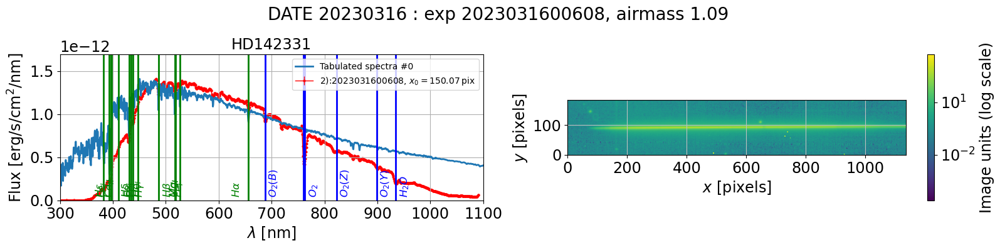

...

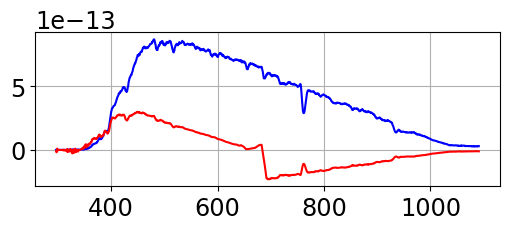

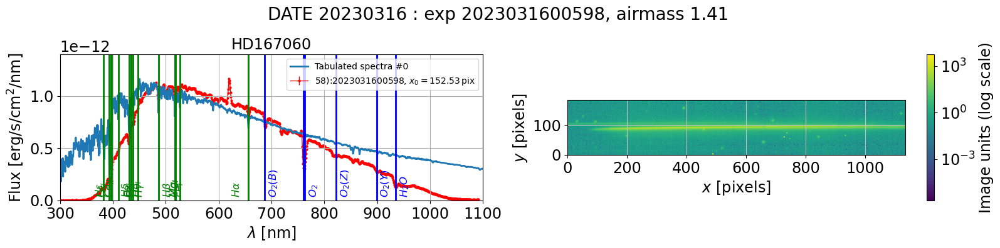

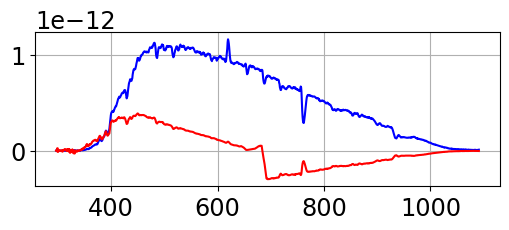

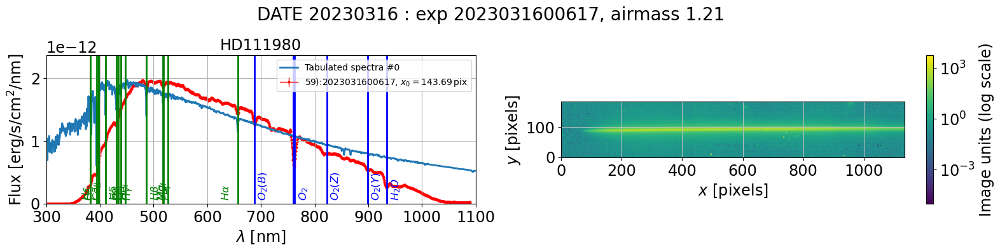

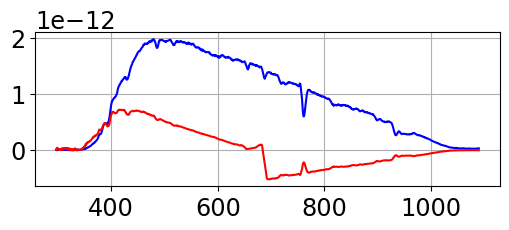

In [37]:
%matplotlib inline


infos = []
all_lambdas=[]
all_data=[]
all_data_err=[]


idx=0
for spec in all_spec:
    
    
    #s=spec.spectrum
    s=spec
    the_exposure = all_exposures[idx]
    label = str(idx) +"):" + str(the_exposure)
    
    group = hf_outfile.get(str(the_exposure))
    airmass = group.attrs["spec_airmass"]
    
    try:
        fig=plt.figure(figsize=(16,4))
        ax1 = fig.add_subplot(1, 2, 1)
        s.plot_spectrum(ax=ax1,force_lines=True,label=label)
    
        ax2 = fig.add_subplot(1, 2, 2)
        s.plot_spectrogram(ax=ax2,scale="log")
    
        all_lambdas.append(s.lambdas)
        all_data.append(s.data)
        all_data_err.append(s.err)
        
        suptitle = f"DATE {DATE} : exp {the_exposure}, airmass {airmass:.2f}"
        plt.suptitle(suptitle,fontsize=20)
        plt.tight_layout()
    
    
        if FLAG_SHOW_ORDER1ORDER2: 
            fig=plt.figure(figsize=(6,2))
            ax1 = fig.add_subplot(1, 1, 1)
        
            lambdas_hf = np.array(group.get("spec_lambdas"))
            data_hf =  np.array(group.get("spec_data"))
            data_next_order_hf =  np.array(group.get("spec_data_next_order"))
            ax1.plot(lambdas_hf,data_hf,'b-')
            ax1.plot(lambdas_hf,data_next_order_hf,'r-')
            ax1.grid()
            plt.show()
            
        
            
    except Exception as inst:
        print(" >>> Exception catched for "+ label )
        print(type(inst))    # the exception instance
        print(inst.args)     # arguments stored in .args

    
    idx+=1

In [38]:
hf_outfile.close() 